In [48]:
import json
import sys
sys.path.append('./home/nbuser/library')

import pandas as pd
pd.options.mode.chained_assignment = None
import requests
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
# from tqdm.auto import tqdm  # for notebooks

df = pd.DataFrame(np.random.randint(0, int(1e8), (10000, 1000)))

# Create and register a new `tqdm` instance with `pandas`
# (can use tqdm_gui, optional kwargs, etc.)
tqdm.pandas()



In [11]:
    properties = pd.read_csv('Properties.csv')
    properties

,Bedrooms,Bathrooms,Address,Land area,CV,Latitude,Longitude,SA1,0-19 years,20-29 years,30-39 years,40-49 years,50-59 years,60+ years,Suburbs
0,5,3.0,"106 Lawrence Crescent Hill Park, Auckland",714,960000,-37.012920,174.904069,7009770,48,27,24,21,24,21,Manurewa
1,5,3.0,"8 Corsica Way Karaka, Auckland",564,1250000,-37.063672,174.922912,7009991,42,18,12,21,15,30,Karaka
2,6,4.0,"243 Harbourside Drive Karaka, Auckland",626,1250000,-37.063580,174.924044,7009991,42,18,12,21,15,30,Karaka
3,2,1.0,"2/30 Hardington Street Onehunga, Auckland",65,740000,-36.912996,174.787425,7007871,42,6,21,21,12,15,Onehunga
4,3,1.0,"59 Israel Avenue Clover Park, Auckland",601,630000,-36.979037,174.892612,7008902,93,27,33,30,21,33,Clover Park
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046,4,1.0,"19 Landscape Road, Auckland",1368 m²,670000,-36.899255,174.761165,7005464,54,18,15,24,21,27,Mount Eden
1047,6,1.0,"56 Galway Street, Auckland",607 m²,1200000,-36.844933,174.770001,7005497,15,27,24,15,18,30,Auckland Central
1048,5,3.0,"28A Hayr Road, Auckland",453 m²,1250000,-36.912242,174.756726,7007758,36,30,45,21,24,21,Three Kings
1049,5,2.0,"27 Market Road, Auckland",1854 m²,5300000,-36.879665,174.787668,7005745,48,18,12,15,36,45,Remuera


In [69]:
def getInfo(row, lng, lat):

    url = 'https://koordinates.com/services/query/v1/vector.json'

    params = {
        'key' : 'eea21f5c0d2840be847c81d45ddc8377',
        'layer' : 104612,
        'x' : lng,
        'y' : lat
    }

    response = requests.get(url, params = params)

    if response.status_code != 200:
        return pd.Series({'Population' : response.status_code})

    currentPop = response.json()['vectorQuery']['layers']['104612']['features'][0]['properties']['C18_CURPop']
    europeanPop = response.json()['vectorQuery']['layers']['104612']['features'][0]['properties']['C18_Ethnicity_L1_European']
    maoriPop = response.json()['vectorQuery']['layers']['104612']['features'][0]['properties']['C18_Ethnicity_L1_Maori']
    pacificPop = response.json()['vectorQuery']['layers']['104612']['features'][0]['properties']['C18_Ethnicity_L1_Pacific_Ppls']
    asianPop = response.json()['vectorQuery']['layers']['104612']['features'][0]['properties']['C18_Ethnicity_L1_Asian']
    # MELAA refers to Middle Eastern/Latin American/African
    MELAAPop = response.json()['vectorQuery']['layers']['104612']['features'][0]['properties']['C18_Ethnicity_L1_MELAA']
    NZPop = response.json()['vectorQuery']['layers']['104612']['features'][0]['properties']['C18_Ethnicity_L2_New_Zealander']



    return currentPop, europeanPop, maoriPop, pacificPop, asianPop, MELAAPop, NZPop

In [28]:
getInfo('174.904069', '-37.012920')

(174, 72, 30, 51, 54, 9, 0)

In [26]:
sample = properties.head(1)

In [70]:
sample[['SA Population', 'European', 'Maori', 'Pacific', 'Asian', 'MELAA', 'NZ']] = properties.apply(getInfo, args=('Longitude', 'Latitude'))


ValueError: Columns must be same length as key

In [63]:
a = sample.apply(lambda x: getInfo(x['Longitude'], x['Latitude']), axis=1)
a.to_frame()

# sample[['SA Population', 'European', 'Maori', 'Pacific', 'Asian', 'MELAA', 'NZ']] = a


,0
0,"(174, 72, 30, 51, 54, 9, 0)"


In [ ]:
properties['SA Population'] = properties.apply(lambda x: getCurrentPopulation(x['Longitude'], x['Latitude']), axis=1)


In [131]:
nzdep2018 = pd.read_csv('nzdep2018.csv')
# drop columns from nzdep2018 dataframe
nzdep2018 = nzdep2018.drop(columns=['SA22018_code', 'SA22018_name', 'URPopnSA1_2018'])
propertiesDeprivation = pd.merge(properties, nzdep2018, how='left', left_on='SA1', right_on='SA12018_code')
propertiesDeprivation

,Bedrooms,Bathrooms,Address,Land area,CV,Latitude,Longitude,SA1,0-19 years,20-29 years,30-39 years,40-49 years,50-59 years,60+ years,Suburbs,SA Population,SA12018_code,NZDep2018,NZDep2018_Score
0,5,3.0,"106 Lawrence Crescent Hill Park, Auckland",714,960000,-37.012920,174.904069,7009770,48,27,24,21,24,21,Manurewa,174,7009770,6.0,997.0
1,5,3.0,"8 Corsica Way Karaka, Auckland",564,1250000,-37.063672,174.922912,7009991,42,18,12,21,15,30,Karaka,129,7009991,1.0,881.0
2,6,4.0,"243 Harbourside Drive Karaka, Auckland",626,1250000,-37.063580,174.924044,7009991,42,18,12,21,15,30,Karaka,129,7009991,1.0,881.0
3,2,1.0,"2/30 Hardington Street Onehunga, Auckland",65,740000,-36.912996,174.787425,7007871,42,6,21,21,12,15,Onehunga,120,7007871,2.0,908.0
4,3,1.0,"59 Israel Avenue Clover Park, Auckland",601,630000,-36.979037,174.892612,7008902,93,27,33,30,21,33,Clover Park,231,7008902,9.0,1091.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046,4,1.0,"19 Landscape Road, Auckland",1368 m²,670000,-36.899255,174.761165,7005464,54,18,15,24,21,27,Mount Eden,159,7005464,1.0,885.0
1047,6,1.0,"56 Galway Street, Auckland",607 m²,1200000,-36.844933,174.770001,7005497,15,27,24,15,18,30,Auckland Central,129,7005497,6.0,981.0
1048,5,3.0,"28A Hayr Road, Auckland",453 m²,1250000,-36.912242,174.756726,7007758,36,30,45,21,24,21,Three Kings,180,7007758,6.0,976.0
1049,5,2.0,"27 Market Road, Auckland",1854 m²,5300000,-36.879665,174.787668,7005745,48,18,12,15,36,45,Remuera,174,7005745,1.0,891.0


## Data Cleaning

In [136]:
# reduce dimensionality of dataset
propertiesDeprivation = propertiesDeprivation.drop(columns=['Latitude', 'Longitude', 'SA1', 'SA12018_code', 'NZDep2018_Score'])

In [132]:
# remove m2 from land area value
propertiesDeprivation['Land area'] = propertiesDeprivation['Land area'].str.extract('(\d+)')

In [133]:
propertiesDeprivation.isnull().sum()

Bedrooms           0
Bathrooms          2
Address            0
Land area          0
CV                 0
Latitude           0
Longitude          0
SA1                0
0-19 years         0
20-29 years        0
30-39 years        0
40-49 years        0
50-59 years        0
60+ years          0
Suburbs            1
SA Population      0
SA12018_code       0
NZDep2018          0
NZDep2018_Score    0
dtype: int64

In [134]:
isNaN = propertiesDeprivation.isnull()
rowhasNaN = isNaN.any(axis=1)
rowswithNaN = properties[rowhasNaN]

print(rowswithNaN)

Bedrooms  Bathrooms                                            Address  \
309         4        NaN                  14 Hea Road Hobsonville, Auckland   
311         4        NaN                  16 Hea Road Hobsonville, Auckland   
568         1        1.0  14 Te Rangitawhiri Road Great Barrier Island, ...   

    Land area       CV   Latitude   Longitude      SA1  0-19 years  \
309       214  1250000 -36.798371  174.647430  7002267          60   
311       245  1100000 -36.798371  174.647430  7002267          60   
568      2141   740000 -36.197282  175.416921  7001131          27   

     20-29 years  30-39 years  40-49 years  50-59 years  60+ years  \
309           66           60           24           24         18   
311           66           60           24           24         18   
568            6            6           18           39         60   

         Suburbs  SA Population  
309  Hobsonville            252  
311  Hobsonville            252  
568          NaN        

In [135]:
propertiesDeprivation = propertiesDeprivation.drop(propertiesDeprivation.index[[309, 311, 568]])

In [137]:
propertiesDeprivation.describe()

,Bedrooms,Bathrooms,CV,0-19 years,20-29 years,30-39 years,40-49 years,50-59 years,60+ years,SA Population,NZDep2018
count,1048.000000,1048.000000,1.048000e+03,1048.000000,1048.000000,1048.00000,1048.000000,1048.000000,1048.000000,1048.000000,1048.000000
mean,3.779580,2.074427,1.388544e+06,47.544847,28.915076,27.00000,24.131679,22.597328,29.353053,179.799618,5.065840
std,1.167894,0.992904,1.184422e+06,24.713408,20.993232,17.93158,10.956798,10.212455,21.810055,71.087298,2.912027
min,1.000000,1.000000,2.700000e+05,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,3.000000,1.000000
25%,3.000000,1.000000,7.800000e+05,33.000000,15.000000,15.00000,18.000000,15.000000,18.000000,138.000000,2.000000
50%,4.000000,2.000000,1.080000e+06,45.000000,24.000000,24.00000,24.000000,21.000000,27.000000,174.000000,5.000000
75%,4.000000,3.000000,1.600000e+06,57.000000,36.000000,33.00000,30.000000,27.000000,36.000000,207.750000,8.000000
max,17.000000,8.000000,1.800000e+07,201.000000,270.000000,177.00000,114.000000,90.000000,483.000000,789.000000,10.000000


In [138]:
propertiesDeprivation.dtypes

Bedrooms           int64
Bathrooms        float64
Address           object
Land area         object
CV                 int64
0-19 years         int64
20-29 years        int64
30-39 years        int64
40-49 years        int64
50-59 years        int64
60+ years          int64
Suburbs           object
SA Population      int64
NZDep2018        float64
dtype: object

In [139]:
propertiesDeprivation['Bathrooms'] = propertiesDeprivation['Bathrooms'].astype(np.int64)

In [140]:
propertiesDeprivation['Land area'] = propertiesDeprivation['Land area'].astype(np.int64)

propertiesDeprivation.dtypes

Bedrooms           int64
Bathrooms          int64
Address           object
Land area          int64
CV                 int64
0-19 years         int64
20-29 years        int64
30-39 years        int64
40-49 years        int64
50-59 years        int64
60+ years          int64
Suburbs           object
SA Population      int64
NZDep2018        float64
dtype: object

array([[<AxesSubplot:title={'center':'0-19 years'}>,
        <AxesSubplot:title={'center':'20-29 years'}>,
        <AxesSubplot:title={'center':'30-39 years'}>],
       [<AxesSubplot:title={'center':'40-49 years'}>,
        <AxesSubplot:title={'center':'50-59 years'}>,
        <AxesSubplot:title={'center':'60+ years'}>],
       [<AxesSubplot:title={'center':'Bathrooms'}>,
        <AxesSubplot:title={'center':'Bedrooms'}>,
        <AxesSubplot:title={'center':'CV'}>],
       [<AxesSubplot:title={'center':'Land area'}>,
        <AxesSubplot:title={'center':'NZDep2018'}>,
        <AxesSubplot:title={'center':'SA Population'}>]], dtype=object)

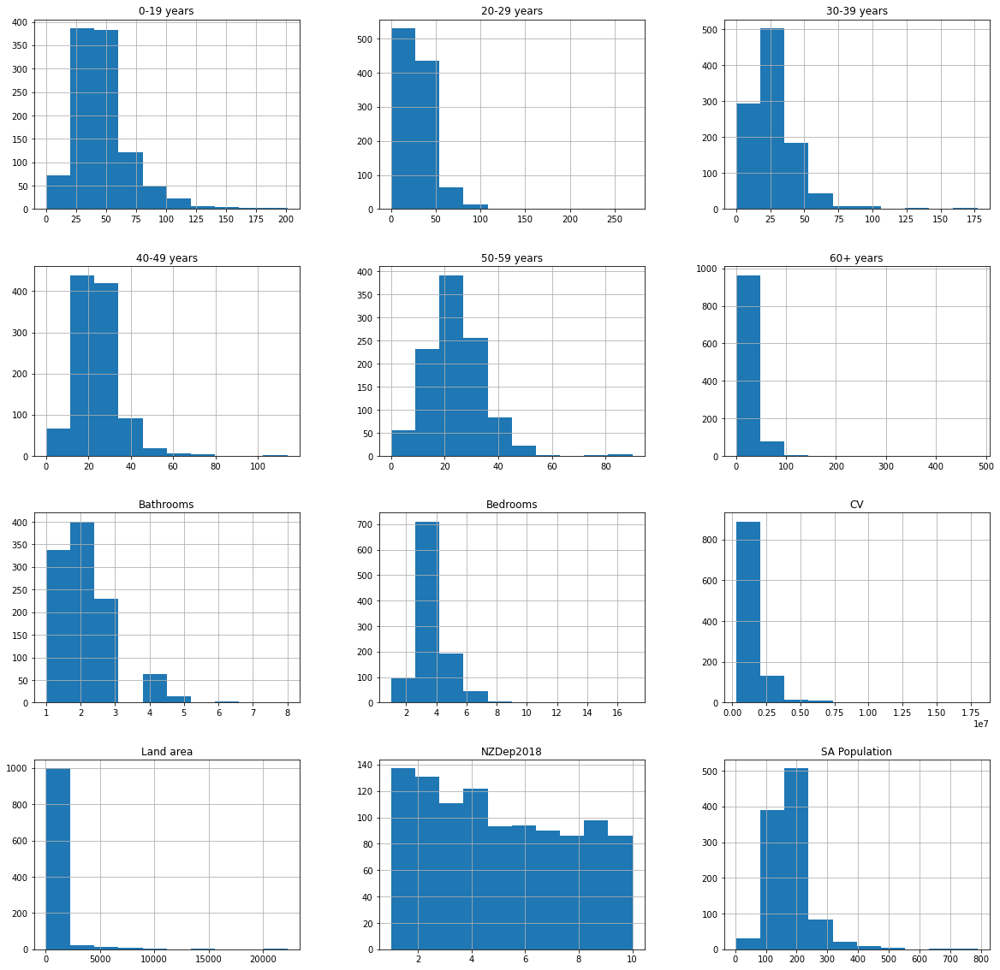

In [141]:
propertiesDeprivation.hist(figsize=(20,20))

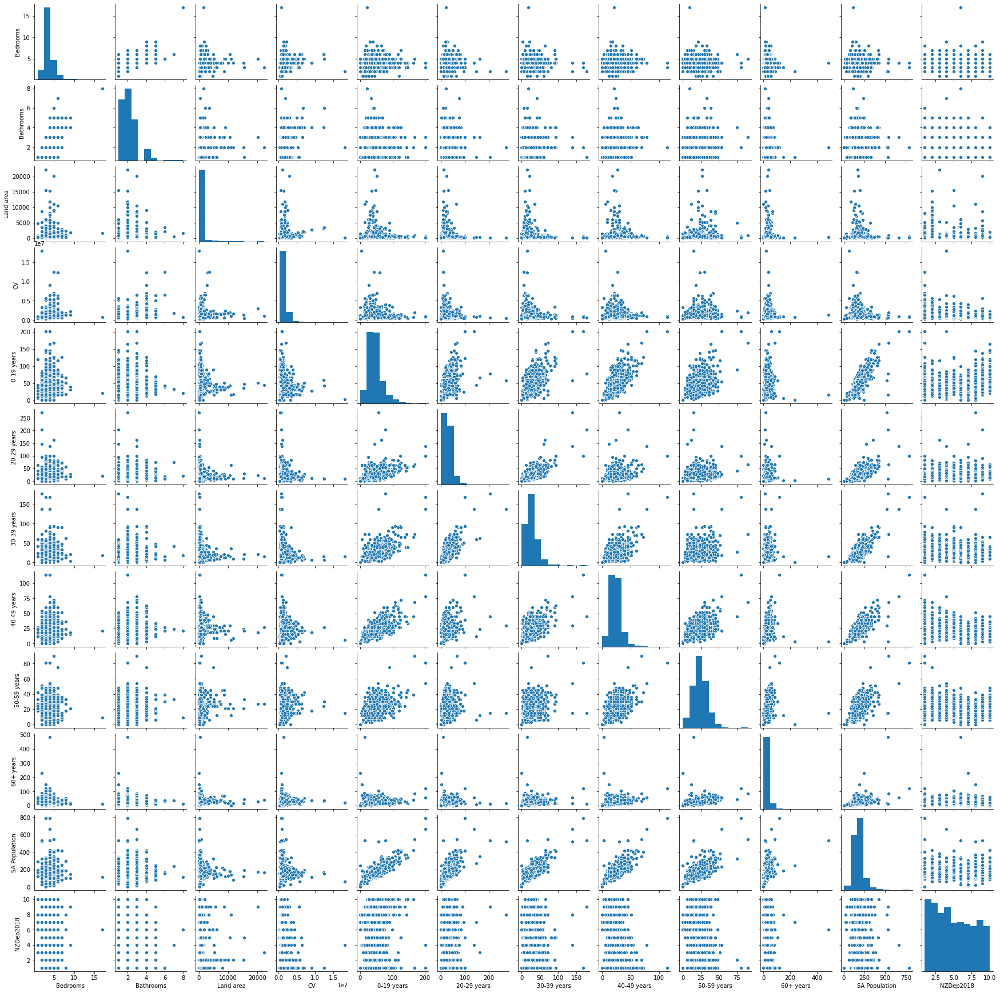

In [142]:
sns.pairplot(propertiesDeprivation, size=2.0)
plt.show()

<AxesSubplot:>

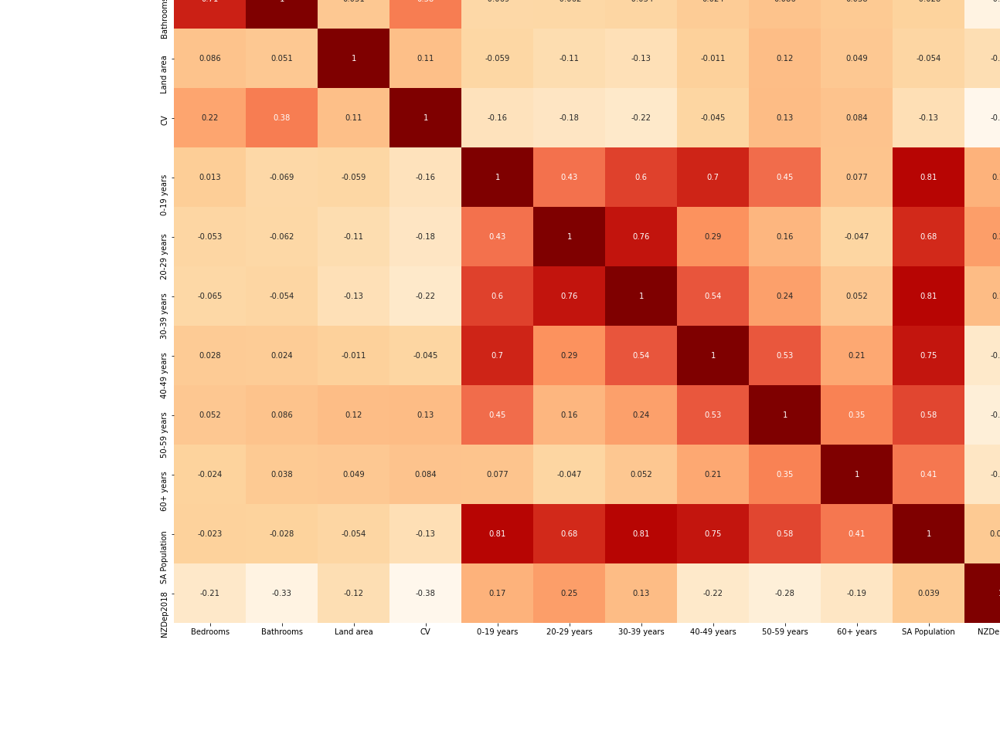

In [158]:
ax, fig = plt.subplots(figsize=(25,17))
corr_matrix = propertiesDeprivation.corr()
sns.heatmap(corr_matrix, annot=True, cmap="OrRd")